# Temperature Forecast Project using ML

# Data Set Information:

This data is for the purpose of bias correction of next-day maximum and minimum air temperatures forecast of the LDAPS model operated by the Korea Meteorological Administration over Seoul, South Korea. This data consists of summer data from 2013 to 2017. The input data is largely composed of the LDAPS model's next-day forecast data, in-situ maximum and minimum temperatures of present-day, and geographic auxiliary variables. There are two outputs (i.e. next-day maximum and minimum air temperatures) in this data. Hindcast validation was conducted for the period from 2015 to 2017.

# Attribute Information:



For more information, read [Cho et al, 2020].
1. station - used weather station number: 1 to 25
2. Date - Present day: yyyy-mm-dd ('2013-06-30' to '2017-08-30')
3. Present_Tmax - Maximum air temperature between 0 and 21 h on the present day (Â°C): 20 to 37.6
4. Present_Tmin - Minimum air temperature between 0 and 21 h on the present day (Â°C): 11.3 to 29.9
5. LDAPS_RHmin - LDAPS model forecast of next-day minimum relative humidity (%): 19.8 to 98.5
6. LDAPS_RHmax - LDAPS model forecast of next-day maximum relative humidity (%): 58.9 to 100
7. LDAPS_Tmax_lapse - LDAPS model forecast of next-day maximum air temperature applied lapse rate (Â°C): 17.6 to 38.5
8. LDAPS_Tmin_lapse - LDAPS model forecast of next-day minimum air temperature applied lapse rate (Â°C): 14.3 to 29.6
9. LDAPS_WS - LDAPS model forecast of next-day average wind speed (m/s): 2.9 to 21.9
10. LDAPS_LH - LDAPS model forecast of next-day average latent heat flux (W/m2): -13.6 to 213.4
11. LDAPS_CC1 - LDAPS model forecast of next-day 1st 6-hour split average cloud cover (0-5 h) (%): 0 to 0.97
12. LDAPS_CC2 - LDAPS model forecast of next-day 2nd 6-hour split average cloud cover (6-11 h) (%): 0 to 0.97
13. LDAPS_CC3 - LDAPS model forecast of next-day 3rd 6-hour split average cloud cover (12-17 h) (%): 0 to 0.98
14. LDAPS_CC4 - LDAPS model forecast of next-day 4th 6-hour split average cloud cover (18-23 h) (%): 0 to 0.97
15. LDAPS_PPT1 - LDAPS model forecast of next-day 1st 6-hour split average precipitation (0-5 h) (%): 0 to 23.7
16. LDAPS_PPT2 - LDAPS model forecast of next-day 2nd 6-hour split average precipitation (6-11 h) (%): 0 to 21.6
17. LDAPS_PPT3 - LDAPS model forecast of next-day 3rd 6-hour split average precipitation (12-17 h) (%): 0 to 15.8
18. LDAPS_PPT4 - LDAPS model forecast of next-day 4th 6-hour split average precipitation (18-23 h) (%): 0 to 16.7
19. lat - Latitude (Â°): 37.456 to 37.645
20. lon - Longitude (Â°): 126.826 to 127.135
21. DEM - Elevation (m): 12.4 to 212.3
22. Slope - Slope (Â°): 0.1 to 5.2
23. Solar radiation - Daily incoming solar radiation (wh/m2): 4329.5 to 5992.9
24. Next_Tmax - The next-day maximum air temperature (Â°C): 17.4 to 38.9
25. Next_Tmin - The next-day minimum air temperature (Â°C): 11.3 to 29.8T

In [103]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [104]:
pd.set_option('display.max_columns',None)
df=pd.read_csv('temp_forecast.csv')
df.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,0.161697,0.130928,0.0,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,0.159444,0.127727,0.0,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,0.204091,0.142125,0.0,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,0.161157,0.134249,0.0,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,0.178892,0.170021,0.0,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


In [105]:
##Checking shape
df.shape

(7752, 25)

We have 7752 rows and 25 attributes including our Target attribute.

We have two Target attributes in this problem statement
1-Next_Tmax: Next day maximum temperature

2- Next_Tmin: Next day  minimum temperature

In [106]:
## Checking data types
df.dtypes

station             float64
Date                 object
Present_Tmax        float64
Present_Tmin        float64
LDAPS_RHmin         float64
LDAPS_RHmax         float64
LDAPS_Tmax_lapse    float64
LDAPS_Tmin_lapse    float64
LDAPS_WS            float64
LDAPS_LH            float64
LDAPS_CC1           float64
LDAPS_CC2           float64
LDAPS_CC3           float64
LDAPS_CC4           float64
LDAPS_PPT1          float64
LDAPS_PPT2          float64
LDAPS_PPT3          float64
LDAPS_PPT4          float64
lat                 float64
lon                 float64
DEM                 float64
Slope               float64
Solar radiation     float64
Next_Tmax           float64
Next_Tmin           float64
dtype: object

1-All of our attributes are of float data type.

2-Date attribute should be in datatime data type but it is in object data type so we will change it.

In [107]:
## Changing the Date to datatime data type......
df['Date']=pd.to_datetime(df['Date'])

In [108]:
df['Month'] = df['Date'].dt.month
df['Day']=df['Date'].dt.day
df['Year']=df['Date'].dt.year

In [109]:
df.drop('Date',axis=1,inplace=True)

In [110]:
## Checking null values
df.isnull().mean()

station             0.000258
Present_Tmax        0.009030
Present_Tmin        0.009030
LDAPS_RHmin         0.009675
LDAPS_RHmax         0.009675
LDAPS_Tmax_lapse    0.009675
LDAPS_Tmin_lapse    0.009675
LDAPS_WS            0.009675
LDAPS_LH            0.009675
LDAPS_CC1           0.009675
LDAPS_CC2           0.009675
LDAPS_CC3           0.009675
LDAPS_CC4           0.009675
LDAPS_PPT1          0.009675
LDAPS_PPT2          0.009675
LDAPS_PPT3          0.009675
LDAPS_PPT4          0.009675
lat                 0.000000
lon                 0.000000
DEM                 0.000000
Slope               0.000000
Solar radiation     0.000000
Next_Tmax           0.003483
Next_Tmin           0.003483
Month               0.000258
Day                 0.000258
Year                0.000258
dtype: float64

We have some missing values in our dataset, but there is less than .001% of values are missing so we can drop all. 

In [111]:
## dropping the missing values
df=df.dropna()

<AxesSubplot:title={'center':'HeatMap of Missing values'}>

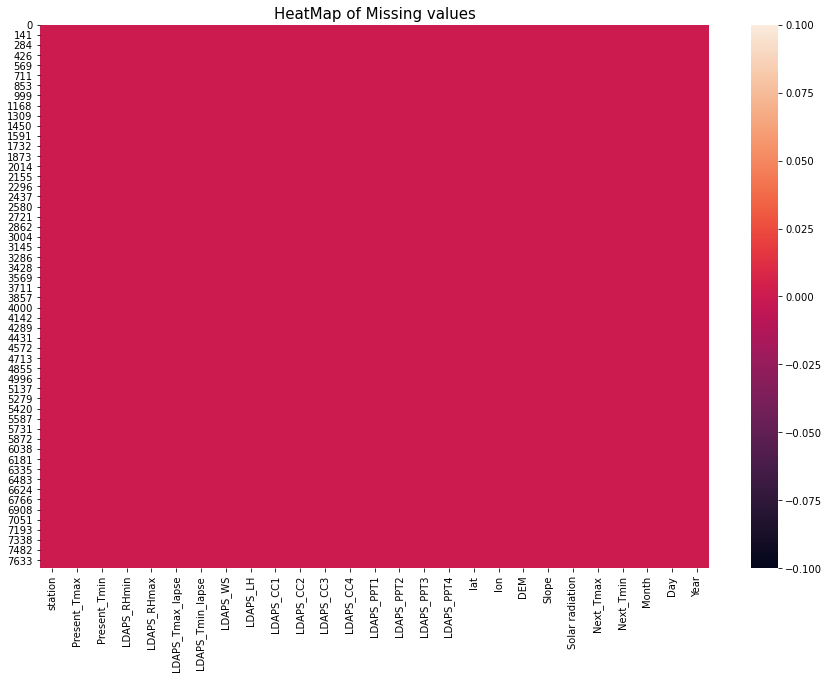

In [112]:
plt.figure(figsize=(15,10))
plt.title('HeatMap of Missing values',fontsize=15)
sns.heatmap(df.isnull())

Now we have remove the missing values from our dataset.

In [113]:
## Statistical Analysis
df.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Month,Day,Year
count,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.00000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000
mean,13.014101,29.748366,23.195809,56.724969,88.360823,29.620128,23.511786,7.094097,62.492606,0.368510,0.355528,0.317546,0.298268,0.589008,0.480738,0.275007,0.265373,37.544792,126.99142,61.918136,1.259755,5343.724208,30.241526,22.910820,7.068134,16.337375,2014.991697
std,7.217858,2.967401,2.400880,14.626559,7.199456,2.943496,2.342579,2.177034,33.686158,0.262260,0.257922,0.249833,0.253392,1.927577,1.743327,1.146087,1.179661,0.050428,0.07922,54.323529,1.372748,429.782561,3.111807,2.482256,2.242389,8.216880,1.410877
min,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.456200,126.82600,12.370000,0.098500,4329.520508,17.400000,11.300000,1.000000,7.000000,2013.000000
25%,7.000000,27.800000,21.600000,45.960243,84.203724,27.673756,22.086820,5.675358,37.206201,0.146546,0.140324,0.100950,0.081495,0.000000,0.000000,0.000000,0.000000,37.510200,126.93700,28.700000,0.271300,5001.485717,28.200000,21.300000,7.000000,8.000000,2014.000000
50%,13.000000,29.900000,23.400000,55.023199,89.784122,29.709537,23.758249,6.547838,56.898324,0.315706,0.311676,0.261795,0.227459,0.000000,0.000000,0.000000,0.000000,37.550700,126.99500,45.716000,0.618000,5441.987305,30.400000,23.100000,7.000000,16.000000,2015.000000
75%,19.000000,32.000000,24.800000,67.115099,93.742725,31.711109,25.155660,8.028960,84.235666,0.574174,0.557164,0.496444,0.498127,0.052594,0.017735,0.007855,0.000017,37.577600,127.04200,59.832400,1.767800,5729.485840,32.600000,24.600000,8.000000,24.000000,2016.000000
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,0.968353,0.983789,0.974710,23.701544,21.621661,15.841235,16.655469,37.645000,127.13500,212.335000,5.178200,5992.895996,38.900000,29.800000,12.000000,31.000000,2017.000000


observation:

1-LDAPS_CC1,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4 has minimum value zero.

2-Most of our attributes are normally distributed because mean and median values are approximatly same.


<AxesSubplot:title={'center':'Correlation Heatmap'}>

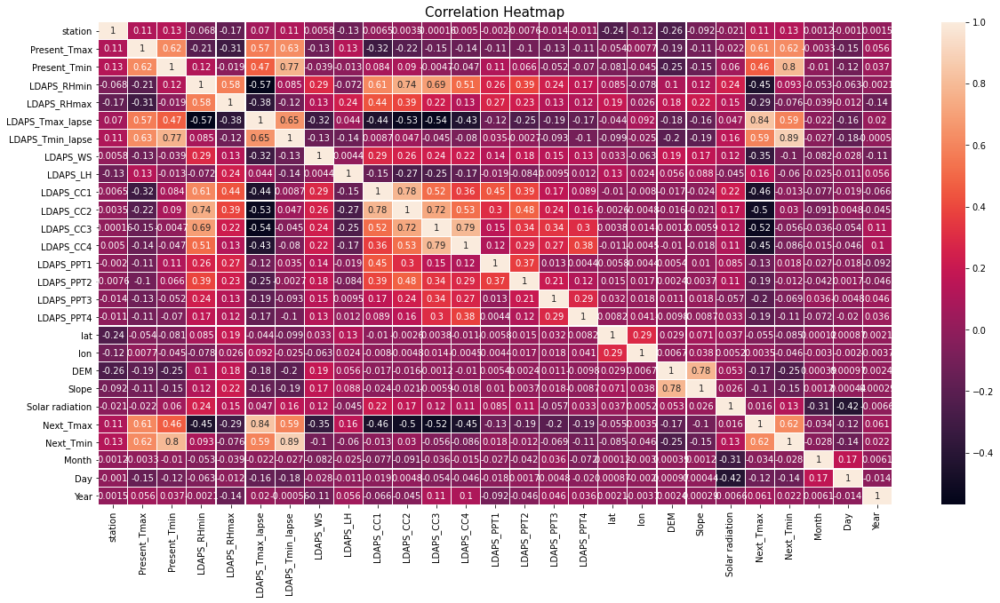

In [114]:
## Correlation Plot
plt.figure(figsize=(20,10))
plt.title('Correlation Heatmap',fontsize=15)
sns.heatmap(df.corr(),annot=True,linewidths=.2)

observation:
    
1-Present_Tmax is positively correlated to Next_Tmax,Next_Tmin, LDAPS_Tmin_lapse, LDAPS_Tmax_lapse, Present_Tmin.

2-Present_Tmin is positively correlated to Next_Tmin,Next_Tmax, LDAPS_Tmin_lapse, LDAPS_Tmax_lapse, Present_Tmax.

3-LDAPS_RHmin is negatively correlated to Next_Tmax,LDAPS_Tmax_lapse and positively correlated to LDAPS_RHmax,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4.

4-LDAPS_RHmax is positively correlated to LDAPS_RHmin.

5-LDAPS_Tmax_lapse is positively correlated to Next_Tmin,Next_Tmax,LDAPS_Tmin_lapse,Present_Tmax,Present_Tmin and negatively correlated to LDAPS_CC1, LDAPS_CC2, LDAPS_CC3, LDAPS_CC4,LDAPS_RHmin.

6-LDAPS_Tmin_lapse is positively correlated to Next_Tmin,Next_Tmax,LDAPS_Tmax_lapse,Present_Tmax and Present_Tmin.


In [115]:
## Correlation with target attribute
df.corr()['Next_Tmax'].sort_values(ascending=False)

Next_Tmax           1.000000
LDAPS_Tmax_lapse    0.835729
Next_Tmin           0.616629
Present_Tmax        0.610357
LDAPS_Tmin_lapse    0.592119
Present_Tmin        0.463523
LDAPS_LH            0.156779
station             0.107747
Year                0.061211
Solar radiation     0.016145
lon                 0.003502
Month              -0.033684
lat                -0.055367
Slope              -0.104279
Day                -0.122303
LDAPS_PPT1         -0.125954
DEM                -0.174578
LDAPS_PPT2         -0.186722
LDAPS_PPT4         -0.190720
LDAPS_PPT3         -0.203554
LDAPS_RHmax        -0.289788
LDAPS_WS           -0.351107
LDAPS_RHmin        -0.446824
LDAPS_CC4          -0.454039
LDAPS_CC1          -0.459705
LDAPS_CC2          -0.498295
LDAPS_CC3          -0.523061
Name: Next_Tmax, dtype: float64

In [116]:
## Correlation with target attribute
df.corr()['Next_Tmin'].sort_values(ascending=False)

Next_Tmin           1.000000
LDAPS_Tmin_lapse    0.886513
Present_Tmin        0.796975
Present_Tmax        0.621048
Next_Tmax           0.616629
LDAPS_Tmax_lapse    0.589963
station             0.128184
Solar radiation     0.125517
LDAPS_RHmin         0.093249
LDAPS_CC2           0.030358
Year                0.021617
LDAPS_PPT1          0.018031
LDAPS_PPT2         -0.012462
LDAPS_CC1          -0.012877
Month              -0.028344
lon                -0.045758
LDAPS_CC3          -0.056490
LDAPS_LH           -0.060392
LDAPS_PPT3         -0.068664
LDAPS_RHmax        -0.076415
lat                -0.085136
LDAPS_CC4          -0.086197
LDAPS_WS           -0.102021
LDAPS_PPT4         -0.114900
Day                -0.135865
Slope              -0.148379
DEM                -0.249303
Name: Next_Tmin, dtype: float64

<AxesSubplot:title={'center':'Coreelation with Next_Tmax'}>

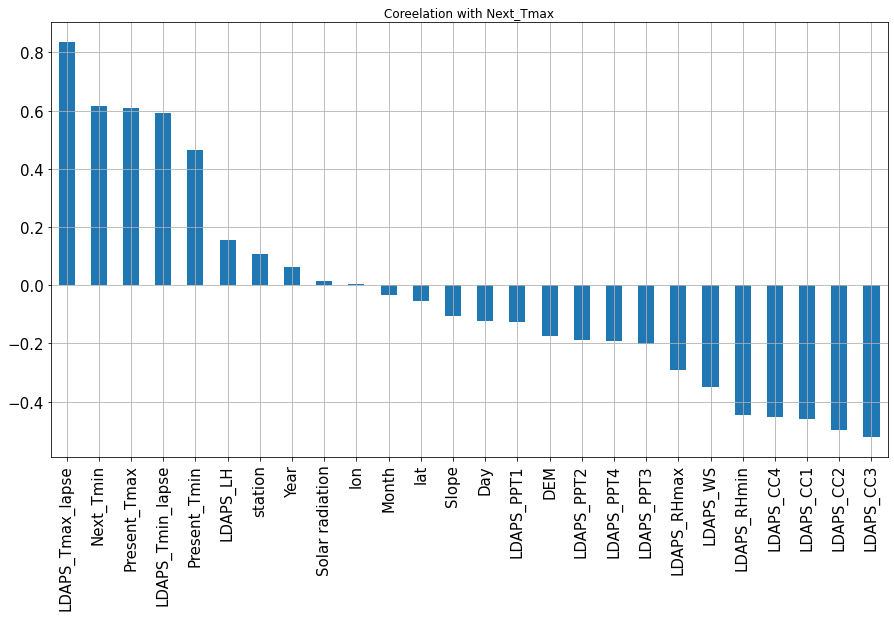

In [117]:
df.corr()['Next_Tmax'].sort_values(ascending=False).drop(['Next_Tmax']).plot.bar(figsize=(15,8),grid=True,title='Coreelation with Next_Tmax',fontsize=15)

1-LDAPS_Tmin_lapse,Present_Tmin,Present_Tmax,Next_Tmax & LDAPS_Tmax_lapse are positively correlated with our target attribute.

2-LDAPS_CC4 ,LDAPS_CC1,LDAPS_CC2 ,LDAPS_CC3 are negatively correlated.

<AxesSubplot:title={'center':'Coreelation with Next_Tmin'}>

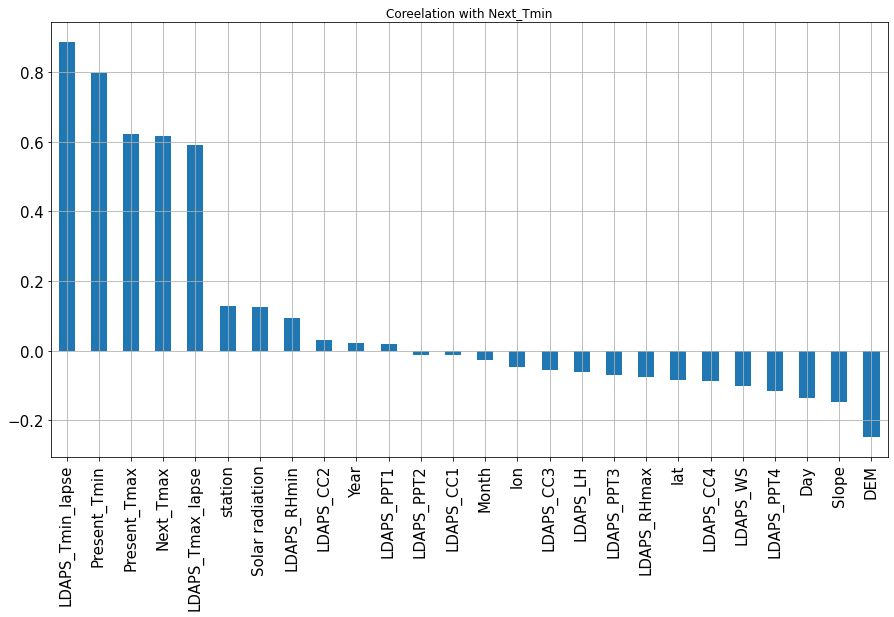

In [118]:
df.corr()['Next_Tmin'].sort_values(ascending=False).drop(['Next_Tmin']).plot.bar(figsize=(15,8),grid=True,title='Coreelation with Next_Tmin',fontsize=15)

1-LDAPS_Tmin_lapse,Present_Tmin,Present_Tmax ,Next_Tmax,LDAPS_Tmax_laps are positively correlated with target attribute.

2-DEM, Slope are negatively correlated with target attribute.

# Data Visualization

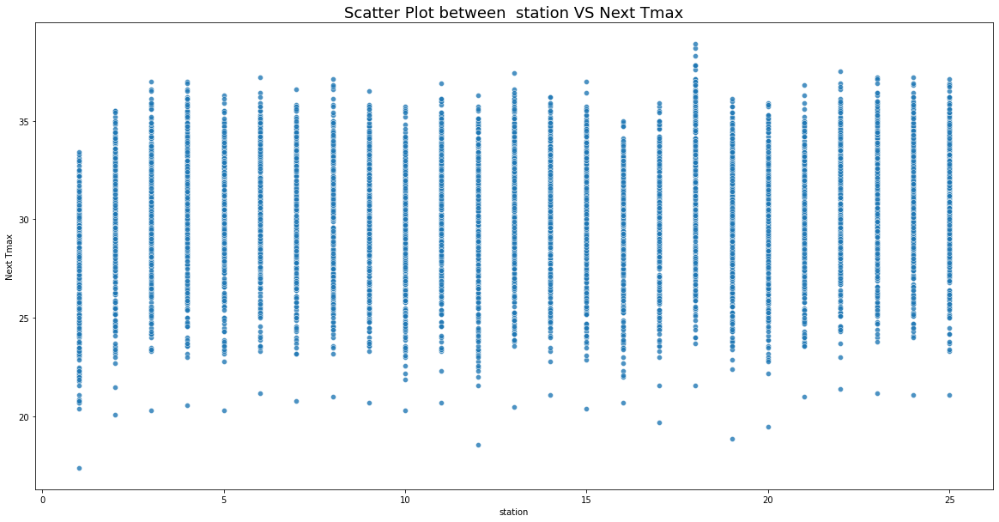

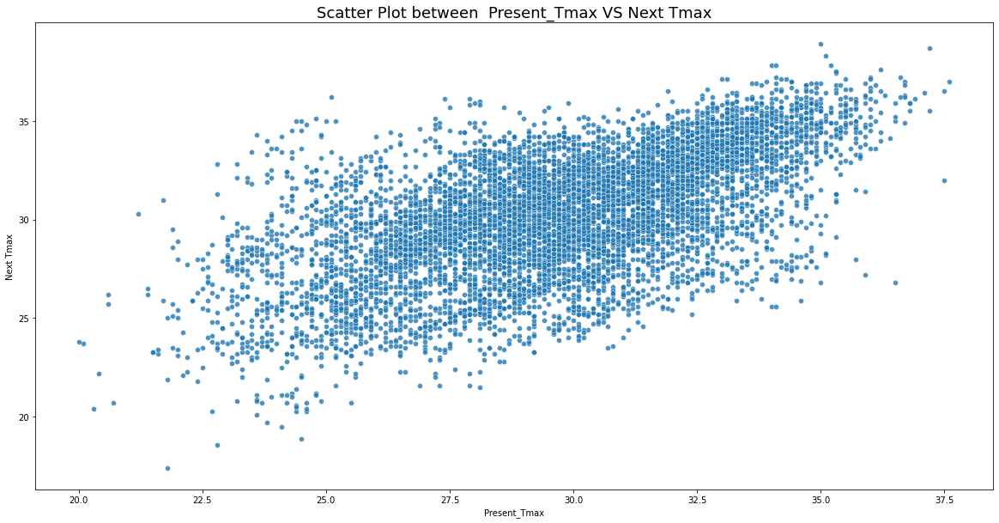

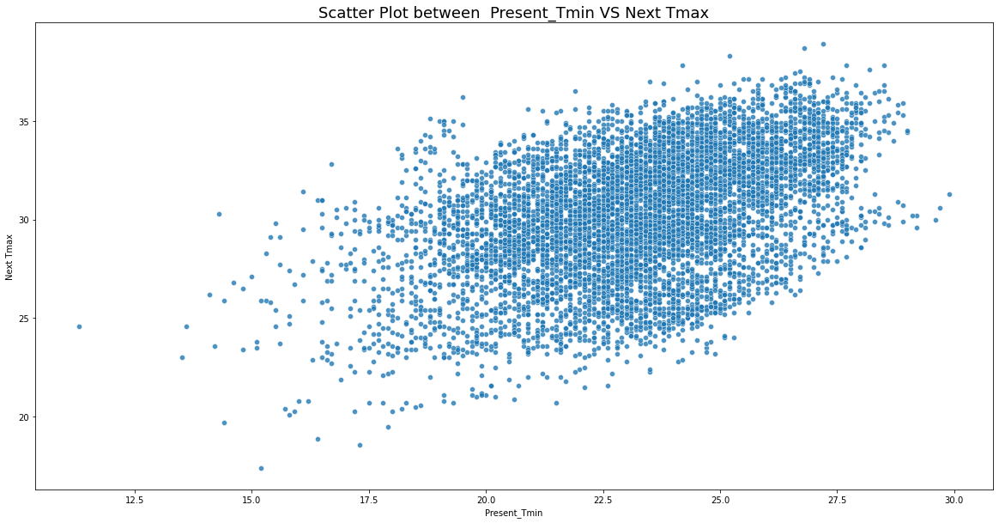

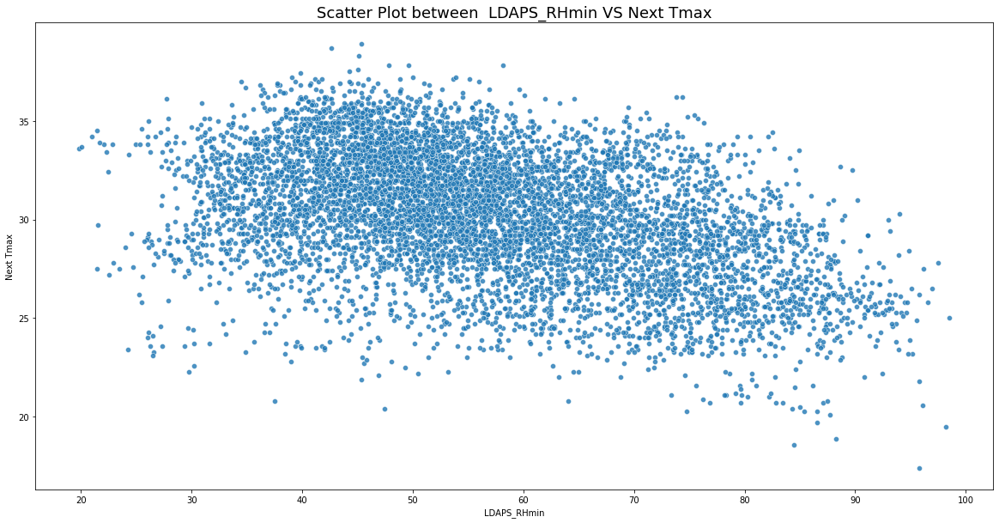

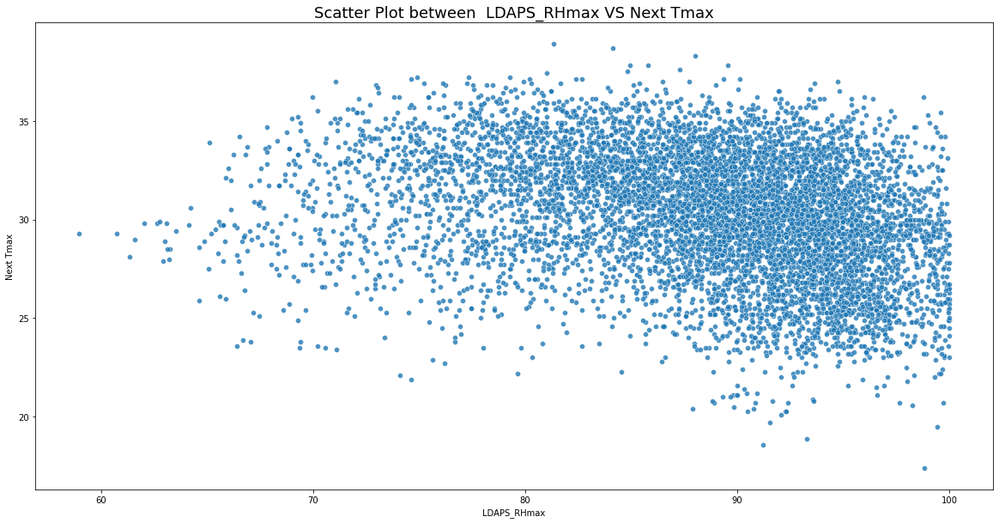

...

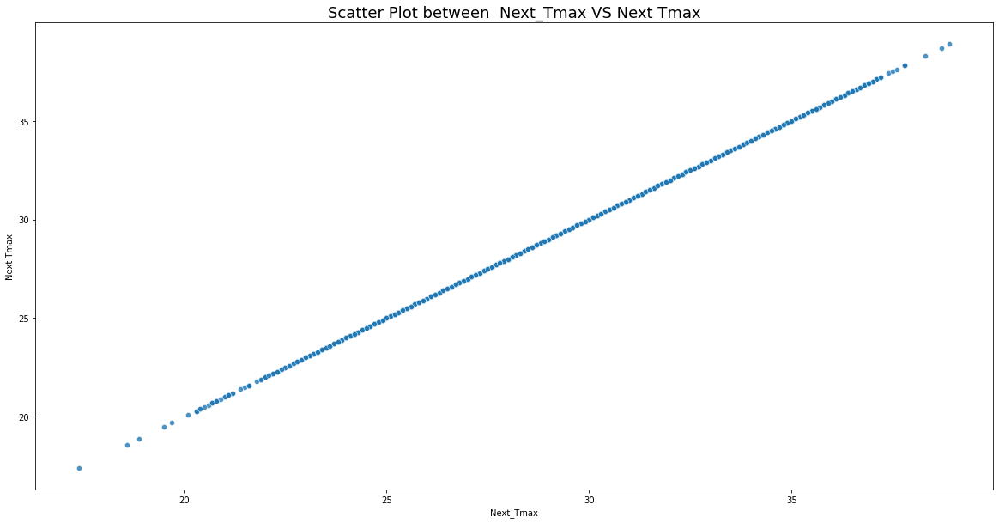

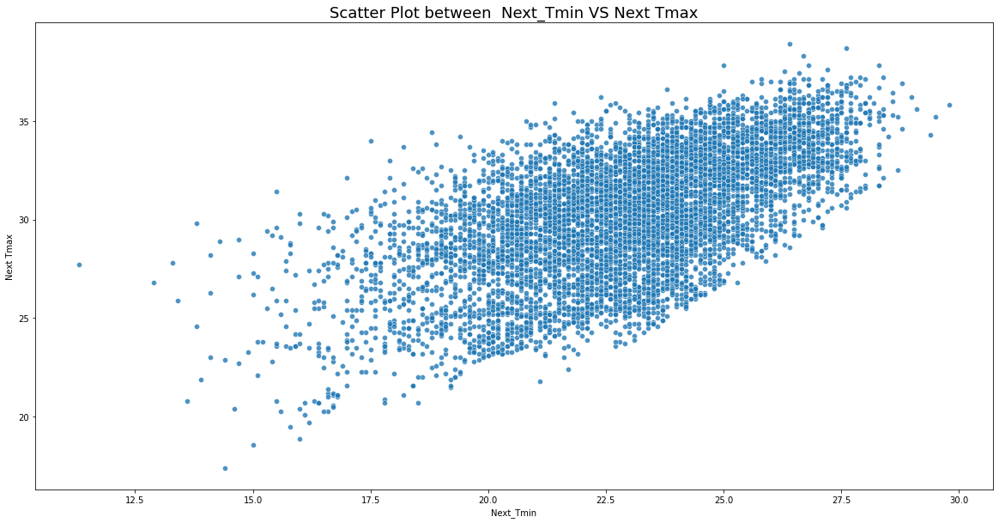

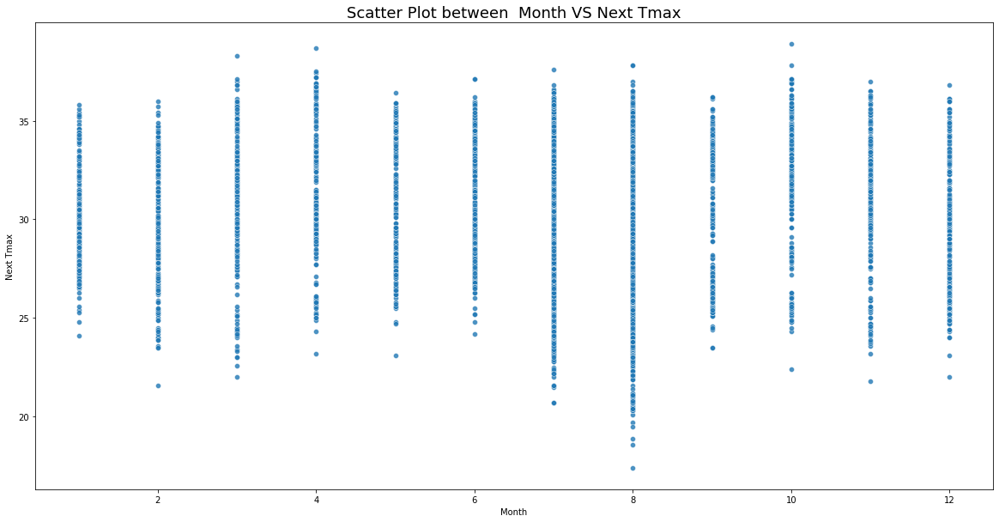

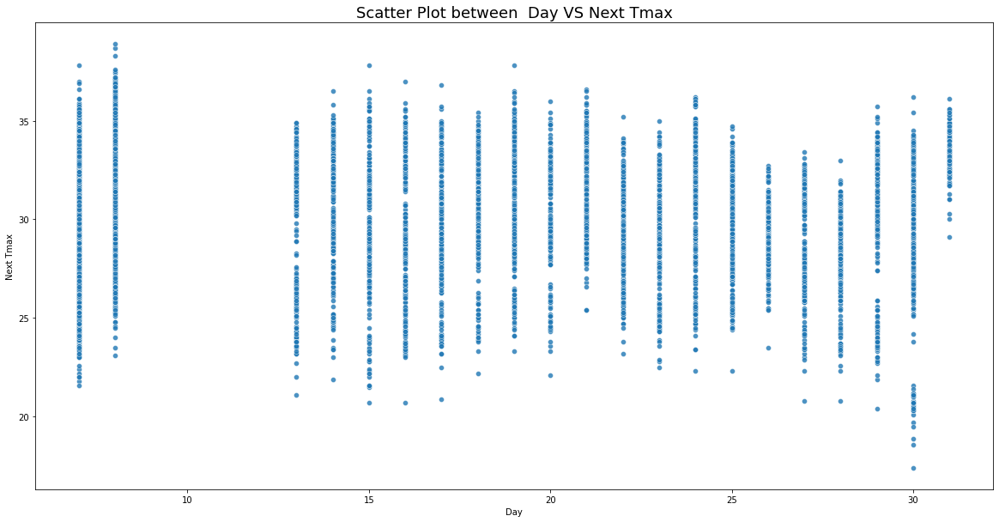

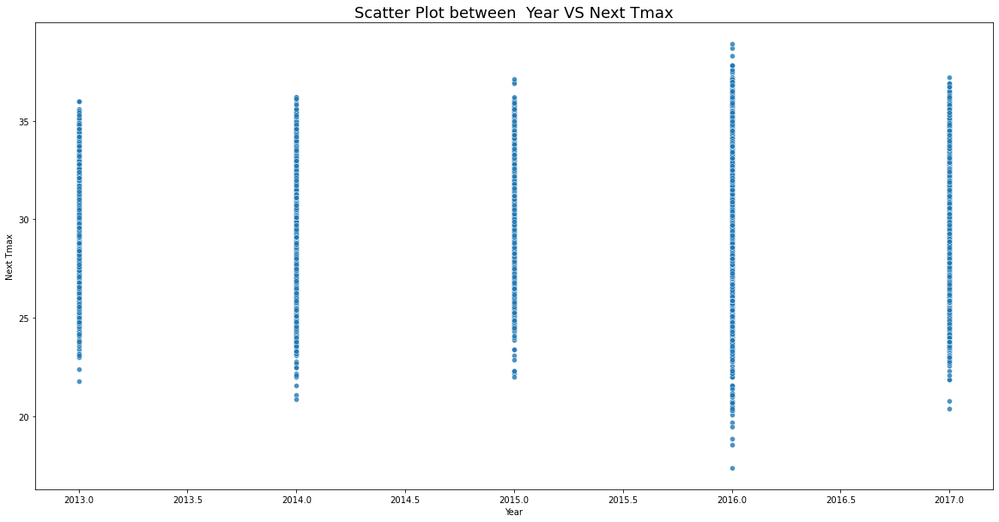

In [120]:
for i in df.columns:                                        
    plt.figure(figsize = (20, 10))
    sns.scatterplot(df[i], df['Next_Tmax'],alpha=0.8, edgecolors='g')
    plt.title('Scatter Plot between  '  +  i +  ' VS Next Tmax',fontsize=18)
    plt.xlabel(i)
    plt.ylabel('Next Tmax')
    plt.show()

Observation:
    
1-There is a very strong linear relation between present tmax and Next tmax.

2- There is a strong linear relation between present tmin and next tmin.

3-LDPs tmin and LDPS tmax are also linearly related.

4-next tmax and next t min are highly linealy related.



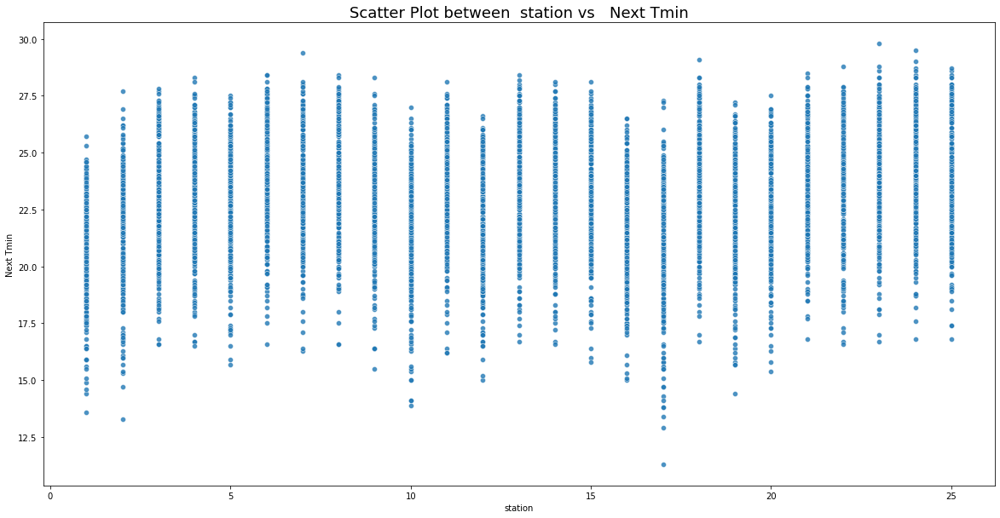

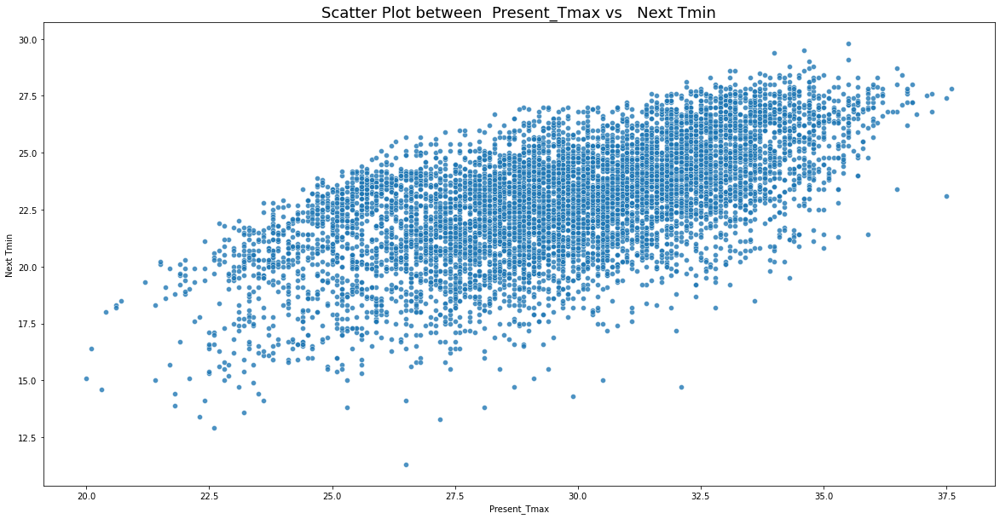

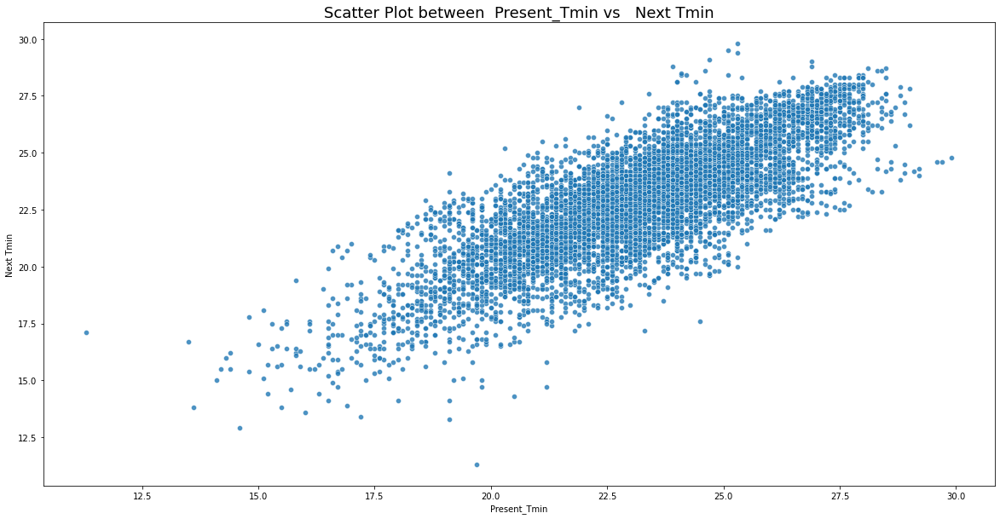

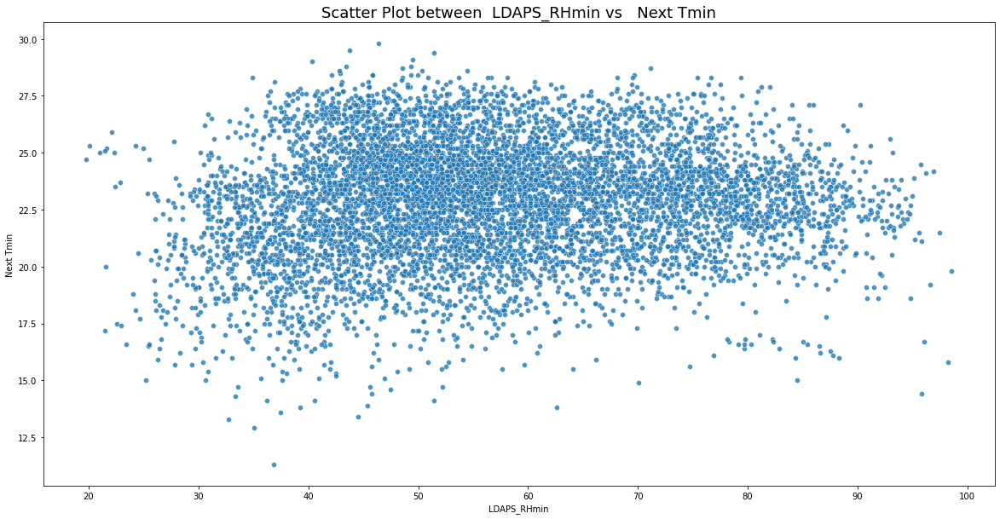

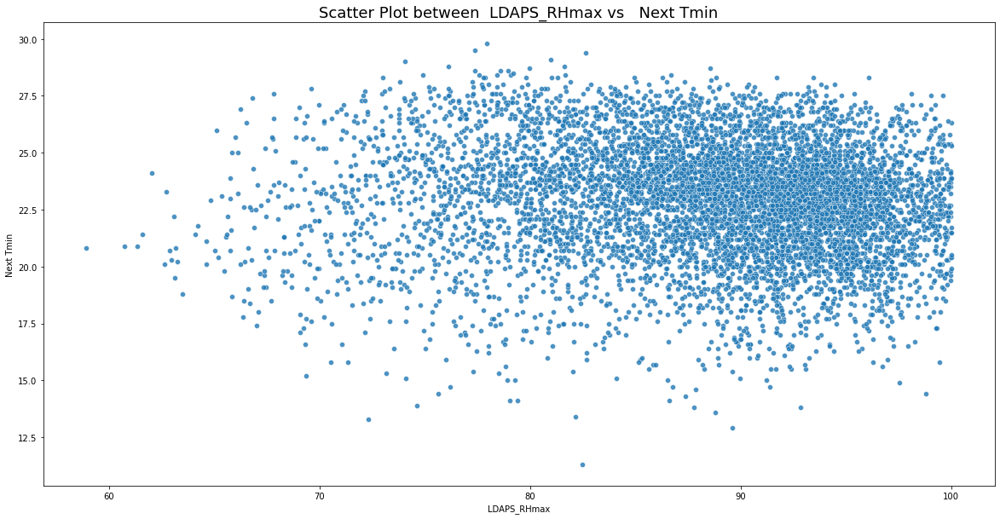

...

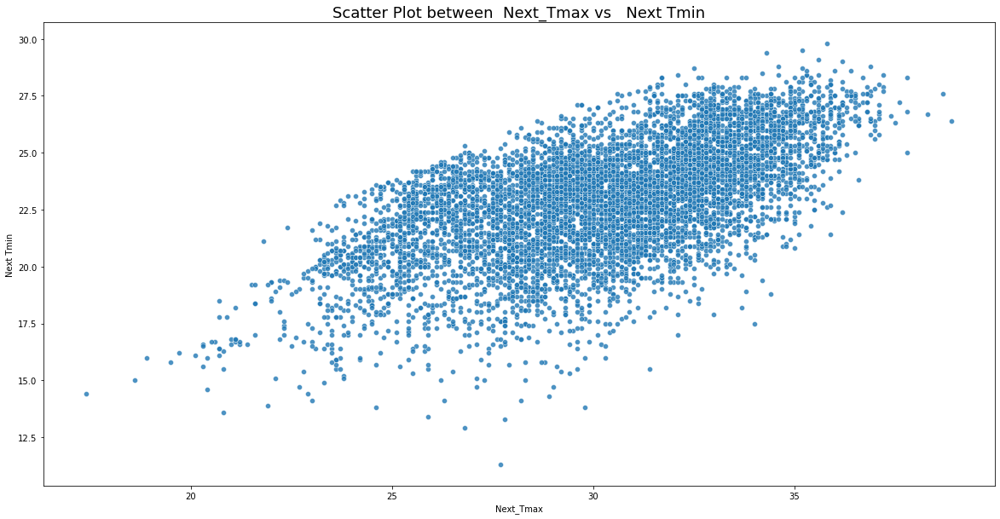

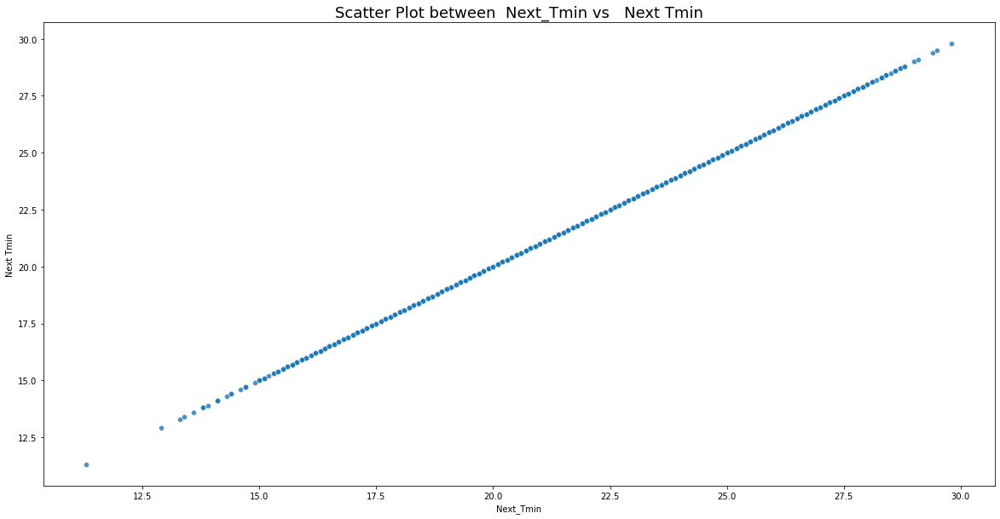

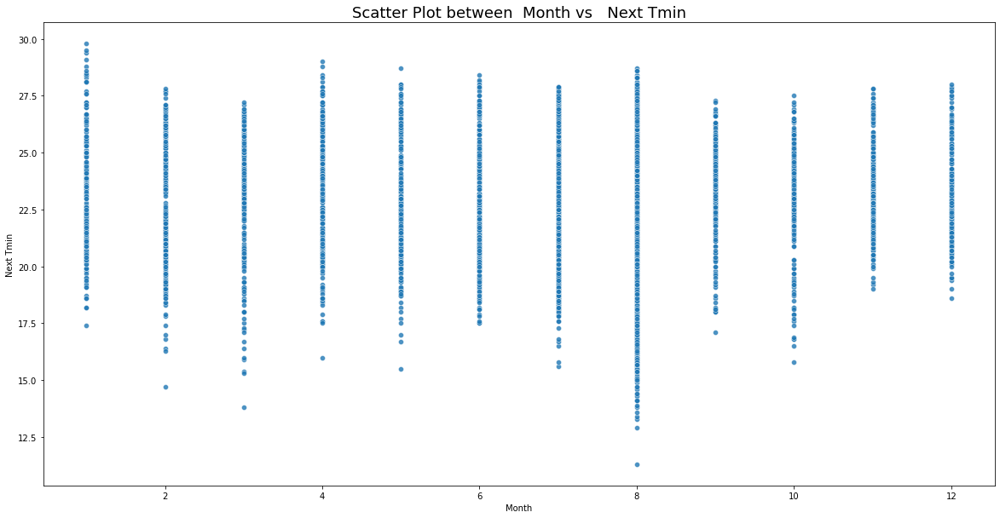

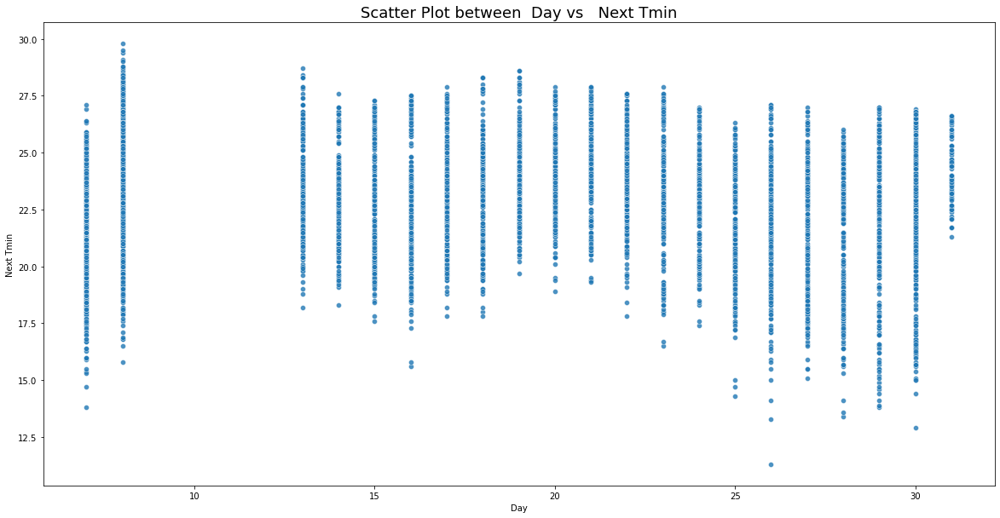

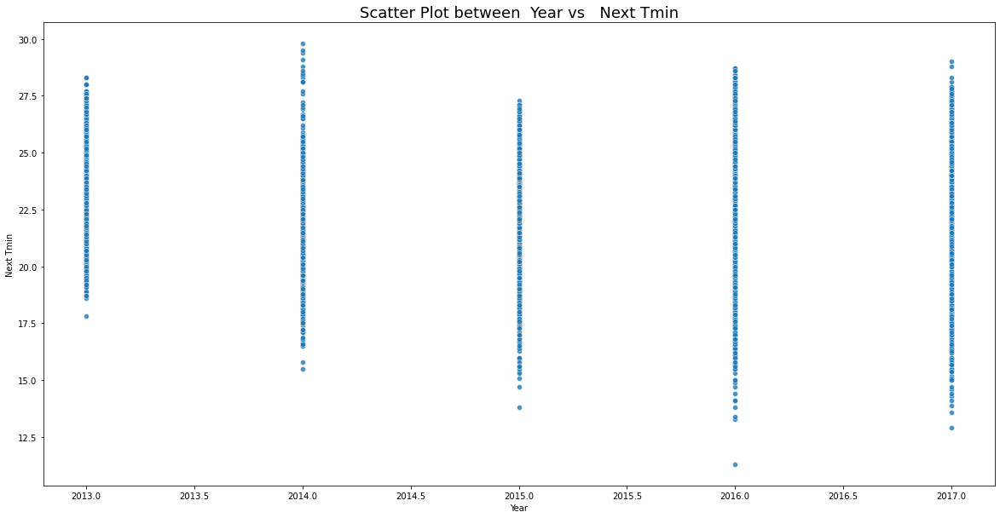

In [122]:
for i in df.columns:                                        
    plt.figure(figsize = (20, 10))
    sns.scatterplot(df[i], df['Next_Tmin'],alpha=0.8, edgecolors='g')
    plt.title('Scatter Plot between  '  +  i +  ' vs   Next Tmin',fontsize=18)
    plt.xlabel(i)
    plt.ylabel('Next Tmin')
    plt.show()

# Data Distribution

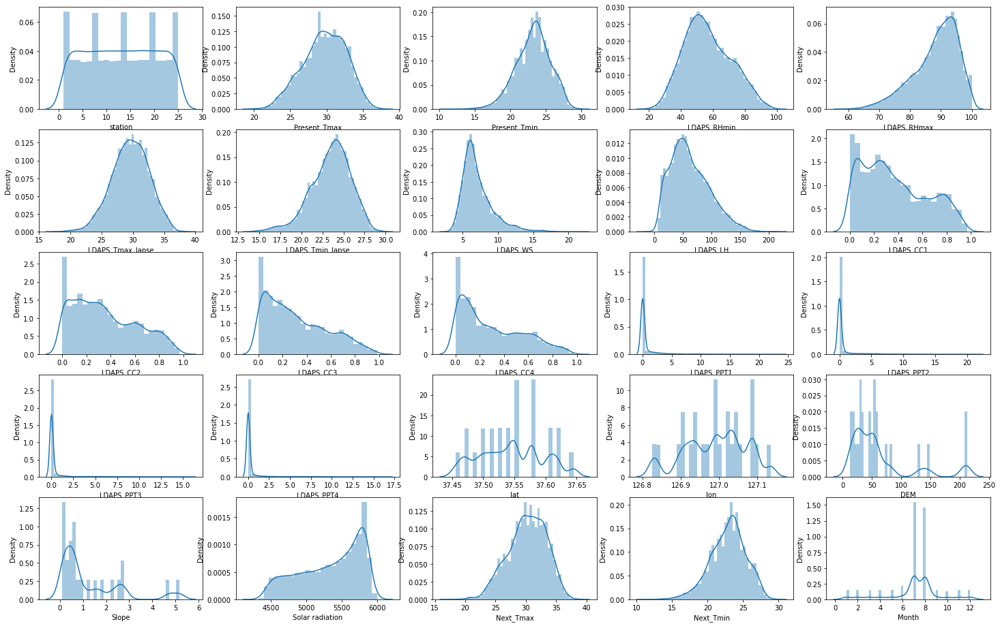

In [123]:
#Data Distribution
plt.figure(figsize=(25,16))
plot=1
for col in df:
    if plot<=25:
        plt.subplot(5,5,plot)
        sns.distplot(df[col])
        plt.xlabel(col)
        plot=plot+1
plt.show()  

Most of our datasets are bell shaped but not perfectlly. we will apply some transformation and remove outliers from skewed data

# Outliers

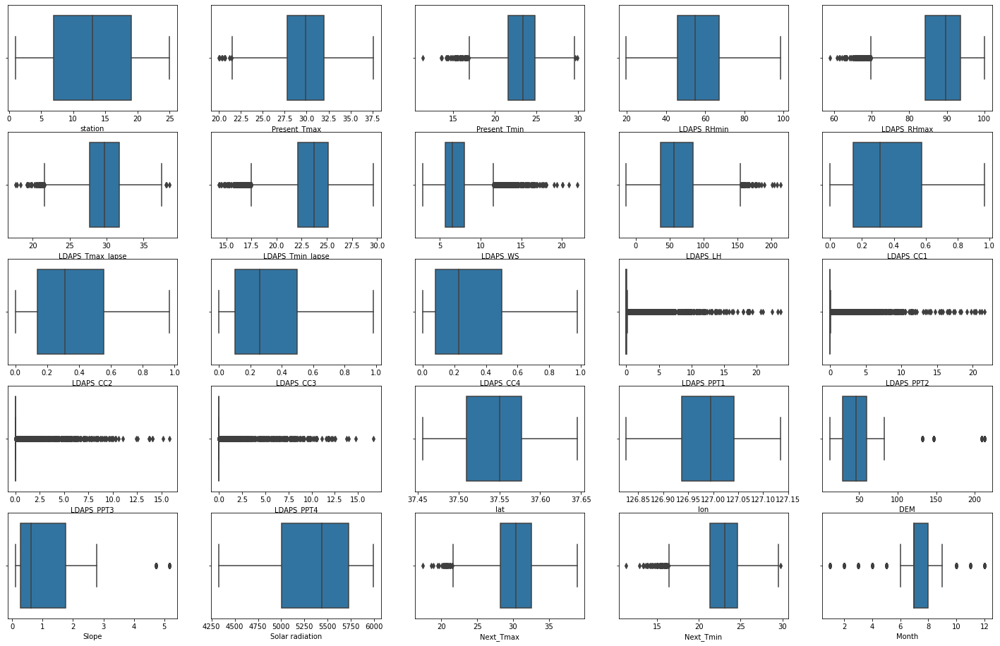

In [124]:
#Data Distribution
df_n=df.select_dtypes(include=float)
plt.figure(figsize=(25,16))
plot=1
for col in df_n:
    if plot<=25:
        plt.subplot(5,5,plot)
        sns.boxplot(df[col])
        plt.xlabel(col)
        plot=plot+1
plt.show()  

In [125]:
def outlier_normally(df,col):
    lower_boundary=df[col].mean()-3*df[col].std()
    upper_boundary=df[col].mean()+3*df[col].std()
    print(lower_boundary,upper_boundary)
    df.loc[df[col]> upper_boundary,col] = upper_boundary
    df.loc[df[col]<lower_boundary,col]=lower_boundary

In [126]:
df.columns

Index(['station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax',
       'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH',
       'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1',
       'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon', 'DEM', 'Slope',
       'Solar radiation', 'Next_Tmax', 'Next_Tmin', 'Month', 'Day', 'Year'],
      dtype='object')

In [127]:
outlier_normally(df,'Present_Tmax')

20.846164256676282 38.65056742492617


In [128]:
outlier_normally(df,'Present_Tmin')
outlier_normally(df,'LDAPS_RHmax')
outlier_normally(df,'LDAPS_Tmax_lapse')
outlier_normally(df,'LDAPS_Tmin_lapse')
outlier_normally(df,'LDAPS_Tmin_lapse')
outlier_normally(df,'LDAPS_LH')
outlier_normally(df,'DEM')
outlier_normally(df,'LDAPS_PPT1')
outlier_normally(df,'LDAPS_PPT2')
outlier_normally(df,'LDAPS_PPT3')
outlier_normally(df,'LDAPS_PPT4')
outlier_normally(df,'Next_Tmax')
outlier_normally(df,'Next_Tmin')

15.993169718481113 30.39844862627386
66.7624544175778 109.95919232315777
20.789639501884455 38.45061587825256
16.484049540199493 30.539522772454852
16.54811577073049 30.487255471955613
-38.565867160498236 163.55107973647432
-101.05245052857654 224.8887234858813
-5.193722077513121 6.37173803438239
-4.749243292101471 5.710720017091718
-3.1632534574156317 3.7132669064053516
-3.273610703159501 3.8043557620988793
20.90610488643034 39.57694730123441
15.464053182619406 30.357586248060688


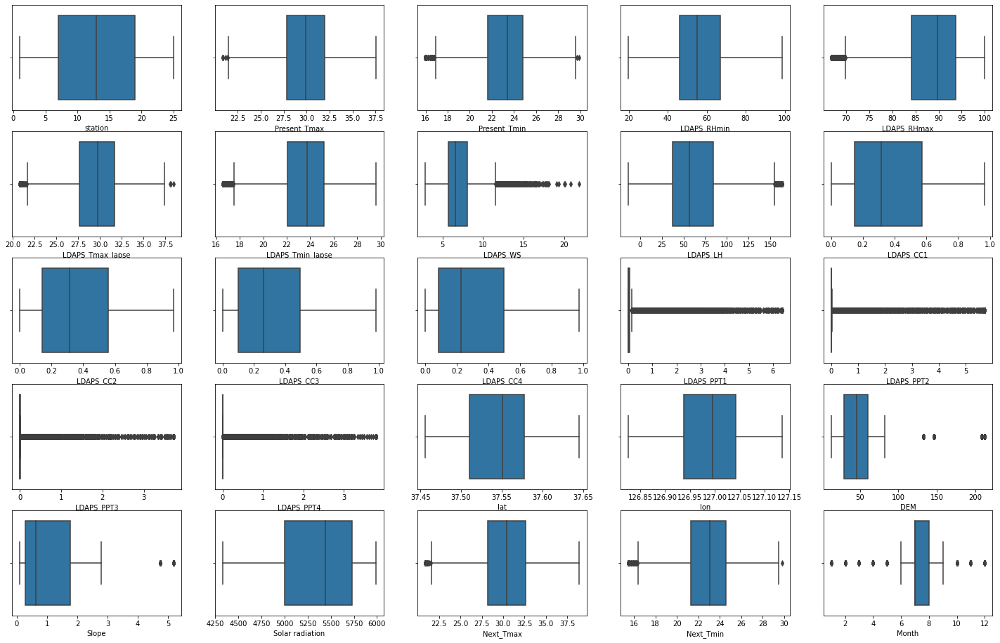

In [129]:
## Again checking the outliers 
plt.figure(figsize=(25,16))
plot=1
for col in df_n:
    if plot<=25:
        plt.subplot(5,5,plot)
        sns.boxplot(df[col])
        plt.xlabel(col)
        plot=plot+1
plt.show()  

we have sucessfully replace the outliers. Now our data has no extreme outliers.

# Skewness

In [130]:
df.skew()

station            -0.004178
Present_Tmax       -0.253705
Present_Tmin       -0.302007
LDAPS_RHmin         0.301396
LDAPS_RHmax        -0.808221
LDAPS_Tmax_lapse   -0.192045
LDAPS_Tmin_lapse   -0.508781
LDAPS_WS            1.553926
LDAPS_LH            0.623116
LDAPS_CC1           0.456716
LDAPS_CC2           0.473929
LDAPS_CC3           0.639649
LDAPS_CC4           0.663815
LDAPS_PPT1          3.284483
LDAPS_PPT2          3.558978
LDAPS_PPT3          4.187147
LDAPS_PPT4          4.323405
lat                 0.085377
lon                -0.289048
DEM                 1.721617
Slope               1.559050
Solar radiation    -0.524325
Next_Tmax          -0.316838
Next_Tmin          -0.345774
Month              -0.703092
Day                 0.245563
Year                0.013575
dtype: float64

In [131]:
df_1=df.copy()

In [132]:
df_1['LDAPS_PPT1'] = np.cbrt(df_1['LDAPS_PPT1'])
df_1['LDAPS_PPT2'] = np.cbrt(df_1['LDAPS_PPT2'])
df_1['LDAPS_PPT3'] = np.cbrt(df_1['LDAPS_PPT3'])
df_1['LDAPS_PPT4'] = np.cbrt(df_1['LDAPS_PPT4'])
df_1['DEM']=np.cbrt(df_1['DEM'])
df_1['Slope']=np.cbrt(df_1['Slope'])
df_1['LDAPS_WS']=np.cbrt(df_1['LDAPS_WS'])


In [133]:
df_1.skew()

station            -0.004178
Present_Tmax       -0.253705
Present_Tmin       -0.302007
LDAPS_RHmin         0.301396
LDAPS_RHmax        -0.808221
LDAPS_Tmax_lapse   -0.192045
LDAPS_Tmin_lapse   -0.508781
LDAPS_WS            0.877761
LDAPS_LH            0.623116
LDAPS_CC1           0.456716
LDAPS_CC2           0.473929
LDAPS_CC3           0.639649
LDAPS_CC4           0.663815
LDAPS_PPT1          1.753714
LDAPS_PPT2          2.050019
LDAPS_PPT3          2.240439
LDAPS_PPT4          2.466333
lat                 0.085377
lon                -0.289048
DEM                 0.919265
Slope               0.612855
Solar radiation    -0.524325
Next_Tmax          -0.316838
Next_Tmin          -0.345774
Month              -0.703092
Day                 0.245563
Year                0.013575
dtype: float64

In [134]:
## When Next_Tamx is our Target
x=df.drop(['Next_Tmax'],axis=1)
y=df[['Next_Tmax']]

# Scaling

In [135]:
from sklearn.preprocessing import StandardScaler
ss=StandardScaler()
x_scaled=ss.fit_transform(x)
x=pd.DataFrame(x_scaled,columns=x.columns)
x

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmin,Month,Day,Year
0,-1.664607,-0.353618,-0.754437,0.104660,0.383209,-0.528256,-0.220209,-0.126423,0.209254,-0.513123,-0.587938,-0.623854,-0.660441,-0.365812,-0.327143,-0.295105,-0.282477,1.186076,-0.005302,2.769091,1.111162,1.510565,-0.695039,-0.476369,1.662861,-1.411767
1,-1.526052,0.725317,-0.670617,-0.305052,0.311727,0.077531,0.222624,-0.644133,-0.313466,-0.545304,-0.402304,-0.632872,-0.673074,-0.365812,-0.327143,-0.295105,-0.282477,1.186076,0.512280,-0.315828,-0.543220,1.222997,-0.168221,-0.476369,1.662861,-1.411767
2,-1.387498,0.624167,0.041856,-0.549344,-0.614708,0.159573,0.451186,-0.439100,-1.249543,-0.606944,-0.380211,-0.454151,-0.616249,-0.365812,-0.327143,-0.295105,-0.282477,0.650626,0.840503,-0.526719,-0.723891,1.209602,0.399122,-0.476369,1.662861,-1.411767
3,-1.248943,0.759034,0.083767,0.103573,1.133078,0.027727,-0.082698,-0.663353,0.098091,-0.580143,-0.502221,-0.626014,-0.647336,-0.365812,-0.327143,-0.295105,-0.282477,1.987268,0.386040,-0.298272,0.928888,1.194265,0.561220,-0.476369,1.662861,-1.411767
4,-1.110389,0.556734,-0.544886,-0.037665,0.248915,-0.173690,-0.013650,-0.624327,1.358705,-0.827872,-0.409191,-0.555021,-0.506152,-0.365812,-0.327143,-0.295105,-0.282477,0.117159,1.812547,-0.494848,-0.549485,1.200286,-0.168221,-0.476369,1.662861,-1.411767
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7583,1.106481,-2.241754,-2.263204,-2.190405,-1.412760,-0.617390,-2.246381,-0.225479,-1.576616,-1.203497,-1.261546,-1.271117,-1.159890,-0.365812,-0.327143,-0.295105,-0.282477,0.117159,0.613271,-0.655747,-0.500966,-2.065599,-2.113396,0.415596,1.662861,1.423537
7584,1.245036,-2.444054,-2.430844,-1.820788,-0.654326,-0.995129,-2.457003,-0.609132,0.588136,-1.151793,-1.283455,-1.271114,-1.107407,-0.365812,-0.327143,-0.295105,-0.282477,-0.686016,1.193973,-0.735482,-0.820711,-2.098689,-2.356543,0.415596,1.662861,1.423537
7585,1.383590,-2.174320,-2.556575,-2.050081,-1.327750,-1.115436,-2.042785,-0.434188,0.287045,-1.290699,-1.064318,-1.271117,-1.177177,-0.365812,-0.327143,-0.295105,-0.282477,-0.150566,-1.267697,-0.852919,-0.804538,-2.095175,-1.951298,0.415596,1.662861,1.423537
7586,1.522145,-2.174320,-2.305114,-2.234735,-1.547777,-0.891031,-2.060945,-0.253241,-0.453618,-1.268430,-1.087864,-1.271117,-1.177177,-0.365812,-0.327143,-0.295105,-0.282477,-0.418291,-1.040466,-0.821476,-0.755800,-2.106671,-1.667627,0.415596,1.662861,1.423537


# Model Building

In [136]:
## Importing machine learning Library
from sklearn.linear_model import LinearRegression,Lasso,Ridge,ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score,accuracy_score
from sklearn.model_selection import cross_val_score,GridSearchCV,train_test_split

In [137]:
def maxr2_score(clf,x,y):
    maxr2_score1=0
    for i in range(42,100):
        x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.20,random_state=i)
        clf.fit(x_train,y_train)
        pred=clf.predict(x_test)
        r2_cscore=r2_score(y_test,pred)
        if r2_cscore>maxr2_score1:
            maxr2_score1=r2_cscore
            final_r=i
    print('max r2 score corresponding to',final_r,'is',maxr2_score1)
    print('cross validation score',cross_val_score(clf,x,y,scoring='r2').mean())
    print('Standard Deviation',cross_val_score(clf,x,y,scoring='r2').std())
    print('Training accuracy',clf.score(x_train,y_train))
    print('Test Accuracy',clf.score(x_test,y_test))
    print('MAE',mean_absolute_error(y_test,pred))
    print('MSE',mean_squared_error(y_test,pred))
    print('RMSE',np.sqrt(mean_squared_error(y_test,pred)))
    
    return final_r


In [138]:
# Linerar regression
lr=LinearRegression()
maxr2_score(lr,x,y)

max r2 score corresponding to 71 is 0.8189761439515697
cross validation score 0.7229054720138764
Standard Deviation 0.05343768246065201
Training accuracy 0.8003118299791244
Test Accuracy 0.8091678782631185
MAE 1.0603551294978732
MSE 1.9223227355732948
RMSE 1.3864785377254474


71

In [140]:
## ridge regression
ridge=Ridge()
maxr2_score(ridge,x,y)

max r2 score corresponding to 71 is 0.8189591832445569
cross validation score 0.722932346581543
Standard Deviation 0.053453563857876106
Training accuracy 0.8003117129473141
Test Accuracy 0.8091631261932748
MAE 1.0603526376799168
MSE 1.9223706049352172
RMSE 1.3864958005472707


71

In [141]:
##Decision Tree Regressor
dt=DecisionTreeRegressor()
maxr2_score(dt,x,y)

max r2 score corresponding to 92 is 0.8342524864162779
cross validation score 0.47913924816442305
Standard Deviation 0.11062170246317445
Training accuracy 1.0
Test Accuracy 0.8148670235081494
MAE 0.9761407676816264
MSE 1.8649131318957615
RMSE 1.3656182233317486


92

In [142]:
## KNN
knn=KNeighborsRegressor()
maxr2_score(knn,x,y)

max r2 score corresponding to 79 is 0.9032192492944268
cross validation score 0.556210690848022
Standard Deviation 0.10625638413623208
Training accuracy 0.9278384436098753
Test Accuracy 0.8890226918791446
MAE 0.7922465297639734
MSE 1.1179155825117717
RMSE 1.0573152711049678


79

In [143]:
## sUPPORT vECTOR
svm=SVR()
maxr2_score(svm,x,y)

max r2 score corresponding to 55 is 0.9087321268246418
cross validation score 0.7052949392400383
Standard Deviation 0.07137368206091504
Training accuracy 0.9161960438215109
Test Accuracy 0.9027505167577421
MAE 0.7186274492230666
MSE 0.9796301113137827
RMSE 0.9897626540306432


55

In [146]:
## Adaboost Regessor
adb=AdaBoostRegressor()
maxr2_score(adb,x,y)

max r2 score corresponding to 68 is 0.7935183409263635
cross validation score 0.6785426294494374
Standard Deviation 0.05360452347536071
Training accuracy 0.7783124434924888
Test Accuracy 0.7802299380218793
MAE 1.2082065355326057
MSE 2.2138253397475296
RMSE 1.4878929194493566


68

In [149]:
r_2_score=[81.89,81.89,83.42,90.32,90.87,79.35]
cross=[72.29,72.29,47.91,55.62,70.52,67.85]

model=['Linear Regression','Ridge','Decision Tree','KNN','Support vector','Adaboost']
best_model=pd.DataFrame({'Model':model,'R2_score':r_2_score,'CRoss validation':cross})
best_model

,Model,R2_score,CRoss validation
0,Linear Regression,81.89,72.29
1,Ridge,81.89,72.29
2,Decision Tree,83.42,47.91
3,KNN,90.32,55.62
4,Support vector,90.87,70.52
5,Adaboost,79.35,67.85


Best on that Ridge regressor is our best model because it has least difference value with our target attribute.

# Hyperparameter Tuning

In [151]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.20,random_state=71)

In [152]:
from sklearn.linear_model import Ridge
parameters = {'alpha':[.0001,.001,.01,.1,1,10],'random_state':list(range(0,10))}
ridge_1=Ridge()
clf=GridSearchCV(ridge_1,parameters)
clf.fit(x_train,y_train)
print(clf.best_params_)

{'alpha': 10, 'random_state': 0}


In [153]:
r_1=Ridge(alpha=10,random_state=0)
r_1.fit(x_train,y_train)
r_1.score(x_train,y_train)
pred=r_1.predict(x_test)
rs=r2_score(y_test,pred)
rs

0.8188022086166516

# Saving our Best Model

In [155]:
import joblib
joblib.dump('r_1','temp_r.pkl')

['temp_r.pkl']

# Loading our Model

In [156]:
loaded_model=joblib.load('temp_r.pkl')

# When Next T_min is our Targe Attribute

In [157]:
## When Next_Tamx is our Target
x1=df.drop(['Next_Tmin'],axis=1)
y1=df[['Next_Tmin']]

In [158]:
from sklearn.preprocessing import StandardScaler
ss=StandardScaler()
x_scaled=ss.fit_transform(x1)
x1=pd.DataFrame(x_scaled,columns=x1.columns)
x1

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Month,Day,Year
0,-1.664607,-0.353618,-0.754437,0.104660,0.383209,-0.528256,-0.220209,-0.126423,0.209254,-0.513123,-0.587938,-0.623854,-0.660441,-0.365812,-0.327143,-0.295105,-0.282477,1.186076,-0.005302,2.769091,1.111162,1.510565,-0.368371,-0.476369,1.662861,-1.411767
1,-1.526052,0.725317,-0.670617,-0.305052,0.311727,0.077531,0.222624,-0.644133,-0.313466,-0.545304,-0.402304,-0.632872,-0.673074,-0.365812,-0.327143,-0.295105,-0.282477,1.186076,0.512280,-0.315828,-0.543220,1.222997,0.082570,-0.476369,1.662861,-1.411767
2,-1.387498,0.624167,0.041856,-0.549344,-0.614708,0.159573,0.451186,-0.439100,-1.249543,-0.606944,-0.380211,-0.454151,-0.616249,-0.365812,-0.327143,-0.295105,-0.282477,0.650626,0.840503,-0.526719,-0.723891,1.209602,0.275830,-0.476369,1.662861,-1.411767
3,-1.248943,0.759034,0.083767,0.103573,1.133078,0.027727,-0.082698,-0.663353,0.098091,-0.580143,-0.502221,-0.626014,-0.647336,-0.365812,-0.327143,-0.295105,-0.282477,1.987268,0.386040,-0.298272,0.928888,1.194265,0.469090,-0.476369,1.662861,-1.411767
4,-1.110389,0.556734,-0.544886,-0.037665,0.248915,-0.173690,-0.013650,-0.624327,1.358705,-0.827872,-0.409191,-0.555021,-0.506152,-0.365812,-0.327143,-0.295105,-0.282477,0.117159,1.812547,-0.494848,-0.549485,1.200286,0.308040,-0.476369,1.662861,-1.411767
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7583,1.106481,-2.241754,-2.263204,-2.190405,-1.412760,-0.617390,-2.246381,-0.225479,-1.576616,-1.203497,-1.261546,-1.271117,-1.159890,-0.365812,-0.327143,-0.295105,-0.282477,0.117159,0.613271,-0.655747,-0.500966,-2.065599,-0.851521,0.415596,1.662861,1.423537
7584,1.245036,-2.444054,-2.430844,-1.820788,-0.654326,-0.995129,-2.457003,-0.609132,0.588136,-1.151793,-1.283455,-1.271114,-1.107407,-0.365812,-0.327143,-0.295105,-0.282477,-0.686016,1.193973,-0.735482,-0.820711,-2.098689,-0.722681,0.415596,1.662861,1.423537
7585,1.383590,-2.174320,-2.556575,-2.050081,-1.327750,-1.115436,-2.042785,-0.434188,0.287045,-1.290699,-1.064318,-1.271117,-1.177177,-0.365812,-0.327143,-0.295105,-0.282477,-0.150566,-1.267697,-0.852919,-0.804538,-2.095175,-0.626051,0.415596,1.662861,1.423537
7586,1.522145,-2.174320,-2.305114,-2.234735,-1.547777,-0.891031,-2.060945,-0.253241,-0.453618,-1.268430,-1.087864,-1.271117,-1.177177,-0.365812,-0.327143,-0.295105,-0.282477,-0.418291,-1.040466,-0.821476,-0.755800,-2.106671,-0.529421,0.415596,1.662861,1.423537


In [159]:
# Linerar regression
lr_1=LinearRegression()
maxr2_score(lr_1,x1,y1)

max r2 score corresponding to 60 is 0.8686521146577824
cross validation score 0.7958145131574837
Standard Deviation 0.09280239027462847
Training accuracy 0.8523838712790018
Test Accuracy 0.8542757833024073
MAE 0.7432613136910802
MSE 0.8900714510131689
RMSE 0.9434359814068832


60

In [161]:
## ridge regression
ridge_1=Ridge()
maxr2_score(ridge_1,x1,y1)

max r2 score corresponding to 60 is 0.8686625315676527
cross validation score 0.7958340732479897
Standard Deviation 0.09277832301410383
Training accuracy 0.8523838016158586
Test Accuracy 0.8542742747591849
MAE 0.7432673511628366
MSE 0.8900806650702779
RMSE 0.9434408646387319


60

In [162]:
##Decision Tree Regressor
dt_1=DecisionTreeRegressor()
maxr2_score(dt_1,x1,y1)

max r2 score corresponding to 85 is 0.8385440554873684
cross validation score 0.5832393102607056
Standard Deviation 0.19035812855547557
Training accuracy 1.0
Test Accuracy 0.8036176296890469
MAE 0.8147007120581577
MSE 1.1994872592714576
RMSE 1.0952110569527034


85

In [163]:
## KNN
knn_1=KNeighborsRegressor()
maxr2_score(knn_1,x1,y1)

max r2 score corresponding to 70 is 0.899514679892361
cross validation score 0.6028471892294958
Standard Deviation 0.15905574908133951
Training accuracy 0.9243496458426046
Test Accuracy 0.8858483870170605
MAE 0.6421615956372408
MSE 0.6972286014346242
RMSE 0.8350021565448943


70

In [165]:
## Adaboost Regessor
adb_1=AdaBoostRegressor()
maxr2_score(adb_1,x1,y1)

max r2 score corresponding to 68 is 0.8373217493379935
cross validation score 0.7532138373497899
Standard Deviation 0.09391196706424652
Training accuracy 0.8306360574292896
Test Accuracy 0.826933673218027
MAE 0.8296757546217247
MSE 1.0570747957425435
RMSE 1.0281414278894434


68

In [167]:
r_2_score=[86.86,86.86,83.85,89.95,83.73]
cross=[79.58,79.58,58.32,60.28,75.32]

model=['Linear Regression','Ridge','Decision Tree','KNN','Adaboost']
best_model=pd.DataFrame({'Model':model,'R2_score':r_2_score,'CRoss validation':cross})
best_model

,Model,R2_score,CRoss validation
0,Linear Regression,86.86,79.58
1,Ridge,86.86,79.58
2,Decision Tree,83.85,58.32
3,KNN,89.95,60.28
4,Adaboost,83.73,75.32


Again Linear regression is our best model because it has least difference with cross validation score

In [168]:
x_train,x_test,y_train,y_test=train_test_split(x1,y1,test_size=.20,random_state=60)

In [ ]:
from sklearn.linear_model import Ridge
parameters = {'alpha':[.0001,.001,.01,.1,1,10],'random_state':list(range(0,10))}
ridge_1=Ridge()
clf=GridSearchCV(ridge_1,parameters)
clf.fit(x_train,y_train)
print(clf.best_params_)